LEVEL 2


In [1]:
#import all necessary Libraries 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [35]:
#load the dataset
df = pd.read_csv('Dataset .csv')
df.head(50)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
5,18189371,Din Tai Fung,162,Mandaluyong City,"Ground Floor, Mega Fashion Hall, SM Megamall, ...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056314,14.583764,Chinese,...,Botswana Pula(P),No,No,No,No,3,4.4,Green,Very Good,336
6,6300781,Buffet 101,162,Pasay City,"Building K, SM By The Bay, Sunset Boulevard, M...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979667,14.531333,"Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.0,Green,Very Good,520
7,6301290,Vikings,162,Pasay City,"Building B, By The Bay, Seaside Boulevard, Mal...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979333,14.540000,"Seafood, Filipino, Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.2,Green,Very Good,677
8,6300010,Spiral - Sofitel Philippine Plaza Manila,162,Pasay City,"Plaza Level, Sofitel Philippine Plaza Manila, ...","Sofitel Philippine Plaza Manila, Pasay City","Sofitel Philippine Plaza Manila, Pasay City, P...",120.980090,14.552990,"European, Asian, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.9,Dark Green,Excellent,621
9,6314987,Locavore,162,Pasig City,"Brixton Technology Center, 10 Brixton Street, ...",Kapitolyo,"Kapitolyo, Pasig City",121.056532,14.572041,Filipino,...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,532


Task 1: Restaurant Ratings
Analyze the distribution of aggregate ratings and determine the most common rating range.
Calculate the average number of votes received by restaurants.

Restaurant Ratings Analysis
------------------------------
Most common rating range: 0.0
Average number of votes received by restaurants: 156.91


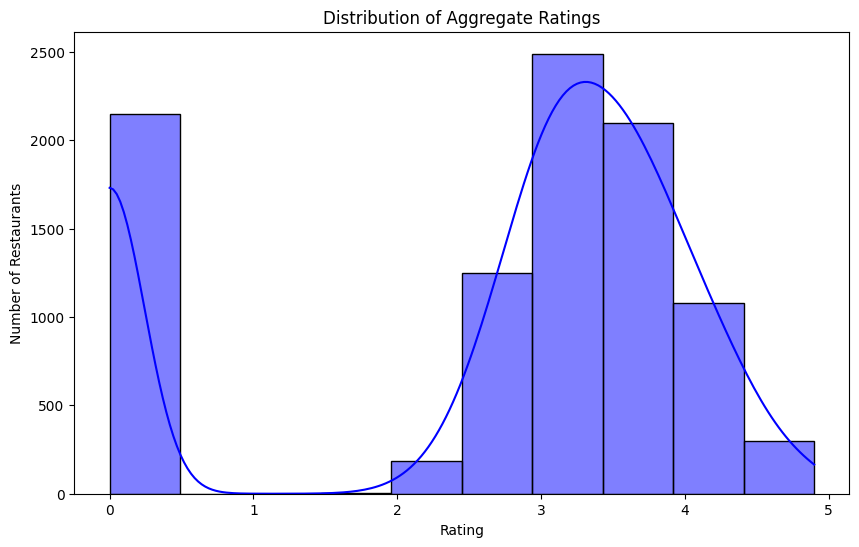

In [3]:
# Analyze the distribution of aggregate ratings
rating_counts = df['Aggregate rating'].value_counts().sort_index()

# Determine the most common rating range
most_common_rating_range = rating_counts.idxmax()

# Calculate the average number of votes received by restaurants
average_votes = df['Votes'].mean()

# Print the results
print("Restaurant Ratings Analysis")
print("-" * 30)
print(f"Most common rating range: {most_common_rating_range}")
print(f"Average number of votes received by restaurants: {average_votes:.2f}")

# Visualize the distribution of ratings
plt.figure(figsize=(10, 6))
sns.histplot(df['Aggregate rating'], bins=10, kde=True, color='blue')
plt.xlabel('Rating')
plt.ylabel('Number of Restaurants')
plt.title('Distribution of Aggregate Ratings')
plt.show()


Task 2: Cuisine Combination

Identify the most common combinations of cuisines in the dataset.
Determine if certain cuisine combinations tend to have higher ratings. 

In [4]:
# Split cuisines into separate columns dynamically
df_cuisines = df['Cuisines'].str.split(', ', expand=True)
print(df_cuisines)

                    0              1         2       3     4     5     6     7
0              French       Japanese  Desserts    None  None  None  None  None
1            Japanese           None      None    None  None  None  None  None
2             Seafood          Asian  Filipino  Indian  None  None  None  None
3            Japanese          Sushi      None    None  None  None  None  None
4            Japanese         Korean      None    None  None  None  None  None
...               ...            ...       ...     ...   ...   ...   ...   ...
9546          Turkish           None      None    None  None  None  None  None
9547    World Cuisine     Patisserie      Cafe    None  None  None  None  None
9548          Italian  World Cuisine      None    None  None  None  None  None
9549  Restaurant Cafe           None      None    None  None  None  None  None
9550             Cafe           None      None    None  None  None  None  None

[9551 rows x 8 columns]


In [5]:
# Rename columns based on the maximum number of cuisines
max_cuisines = df_cuisines.shape[1]
column_names = [f'Cuisine{i+1}' for i in range(max_cuisines)]
df_cuisines.columns = column_names[:max_cuisines]  # Limit to maximum columns found

# Combine with the original DataFrame
df_combined = pd.concat([df['Restaurant Name'], df_cuisines], axis=1)

# Melt the DataFrame to long format
df_melted = df_combined.melt(id_vars=['Restaurant Name'], value_vars=column_names, var_name='Cuisine_Number', value_name='Cuisine')

# Drop rows with NaN values in 'Cuisine' column
df_melted.dropna(subset=['Cuisine'], inplace=True)

# Count the frequency of each cuisine
cuisine_counts = df_melted['Cuisine'].value_counts()

print(cuisine_counts)


Cuisine
North Indian         3960
Chinese              2735
Fast Food            1986
Mughlai               995
Italian               764
                     ... 
Cuisine Varies          1
Peruvian                1
Gourmet Fast Food       1
Irish                   1
Malay                   1
Name: count, Length: 145, dtype: int64


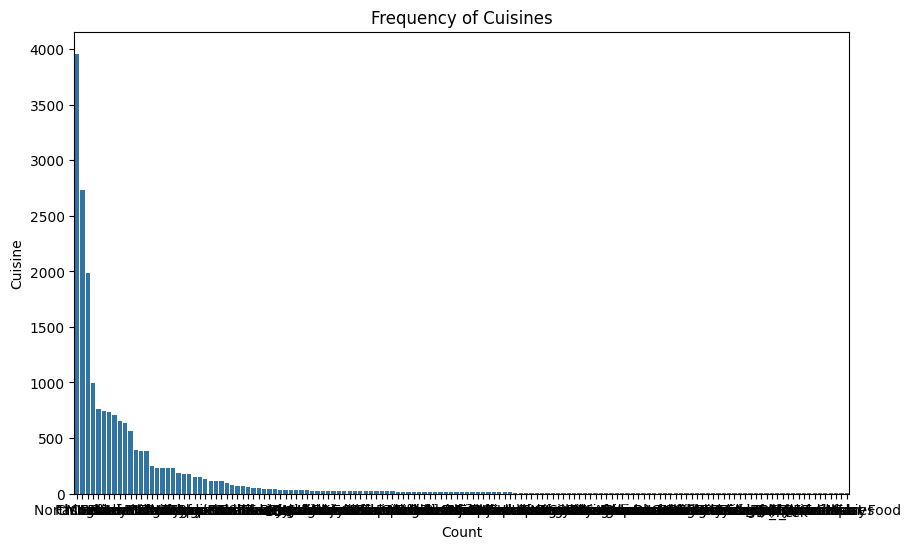

In [6]:
plt.figure(figsize=(10, 6))
sns.barplot(data=cuisine_counts)
plt.title('Frequency of Cuisines')
plt.xlabel('Count')
plt.ylabel('Cuisine')
plt.show()     

Task 3: Geographic Analysis

Plot the locations of restaurants on a
map using longitude and latit de
coordinats.

Identify any patterns or clust rs of
restaurants in specific areas.

In [7]:
import folium
from folium.plugins import MarkerCluster

map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=12)

# Add a marker cluster to the map
marker_cluster = MarkerCluster().add_to(m)

# Add markers for each restaurant
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']}<br>Rating: {row['Aggregate rating']}<br>Cuisines: {row['Cuisines']}",
        tooltip=row['Restaurant Name']
    ).add_to(marker_cluster)

# Save the map to an HTML file and display it
m.save("restaurants_map.html")

# Display the map if using Jupyter Notebook
m

Task 4: Restaurant Chains
Identify if there are any restaurant chains present in the dataset.
Analyze the ratings and popularity of different restaurant chains.

In [20]:
# Identify restaurant chains by counting occurrences
chain_counts = df['Restaurant Name'].value_counts()
chains = chain_counts[chain_counts > 1].index.tolist()

Top Chains (by name length): ['Muradabadi Shahi Biryani & Chicken Corner', 'Moti Mahal Delux- Legendary Culinary', 'Chalte Firte Momos & Special Foods', 'Fluffles - The Fluffy Waffle Co.', 'Chutneez Restaurant Lounge & Bar', 'The Mad Teapot/The Wishing Chair', 'Moti Mahal Delux Tandoori Trail', "Hangchuaa's Chinese Food Corner", 'Radha Swami Shudh Vaishno Dhaba', 'MR.D - Deliciousness Delivered']


C:\Users\Preety\AppData\Local\Temp\ipykernel_10488\3942248264.py:9: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  chain_data = pd.concat([chain_data, pd.DataFrame({


Top Chains by Average Rating and Popularity:
               Restaurant Name  Aggregate Rating Number of Cities
182           Talaga Sampireun             4.900                2
587           Silantro Fil-Mex             4.850                2
323    AB's Absolute Barbecues             4.850                1
152  AB's - Absolute Barbecues             4.825                3
277         Naturals Ice Cream             4.800                1
514                   Gymkhana             4.700                2
269     The Cheesecake Factory             4.650                2
510                    Dishoom             4.600                1
562          Garota de Ipanema             4.600                1
87                     Chili's             4.580                4
Top Chains by Average Rating and Popularity:
               Restaurant Name  Aggregate Rating Number of Cities
182           Talaga Sampireun             4.900                2
587           Silantro Fil-Mex             4.850    

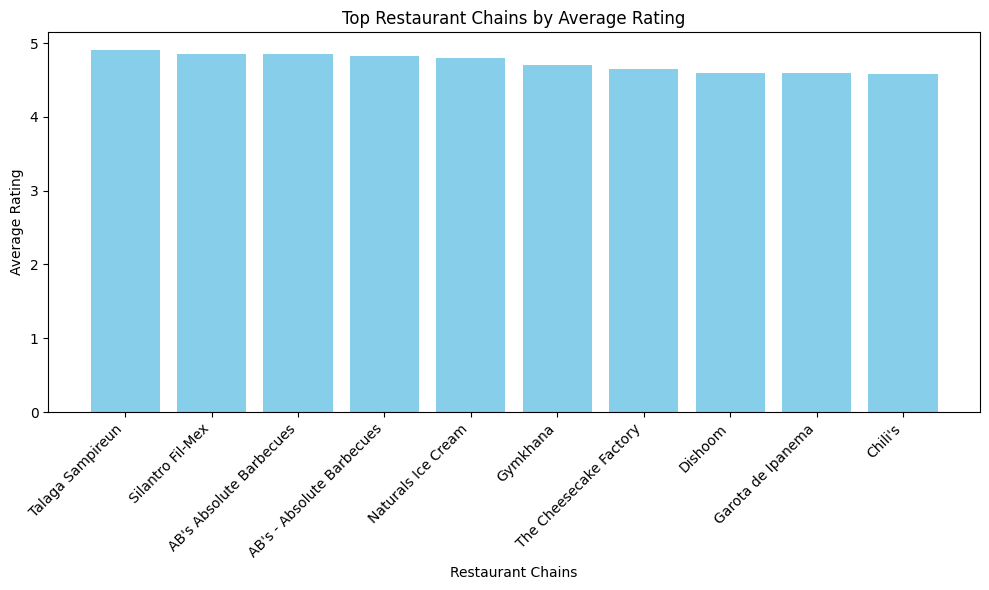

In [32]:
# Create a DataFrame to store chain ratings and popularity
chain_data = pd.DataFrame(columns=['Restaurant Name', 'Aggregate Rating', 'Number of Cities'])

# Calculate average ratings and count cities for each chain
for chain in chains:
    chain_df = df[df['Restaurant Name'] == chain]
    average_rating = chain_df['Aggregate rating'].mean()
    num_cities = len(chain_df['City'].unique())  # Count unique cities
    chain_data = pd.concat([chain_data, pd.DataFrame({
        'Restaurant Name': [chain],
        'Aggregate Rating': [average_rating],
        'Number of Cities': [num_cities]
    })], ignore_index=True)

# Sort chains by average rating (descending) and number of cities (descending)
chain_data = chain_data.sort_values(by=['Aggregate Rating', 'Number of Cities'], ascending=[False, False])

# Display the results
print("Top Chains by Average Rating and Popularity:")
print(chain_data.head(10))

# Display the results
print("Top Chains by Average Rating and Popularity:")
print(chain_data.head(10))

# Visualization
plt.figure(figsize=(10, 6))
plt.bar(chain_data['Restaurant Name'][:10], chain_data['Aggregate Rating'][:10], color='skyblue')
plt.xlabel('Restaurant Chains')
plt.ylabel('Average Rating')
plt.title('Top Restaurant Chains by Average Rating')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()
